In [63]:
%%capture
import sys
#!{sys.executable} -m pip install librosa
#!{sys.executable} -m pip install pyyaml h5py 
#!{sys.executable} -m pip install pydub

In [1]:
#
import os
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
import numpy as np
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical


import IPython.display as ipd
import librosa
import librosa.display
import pandas as pd


2023-05-20 18:52:02.244078: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [12]:
import os

current_directory = os.getcwd()
print(current_directory)


/Users/rolam/Documents/Uchicago MSCA/MSCA Machine Learning and Predictive Analytics/FinalProject


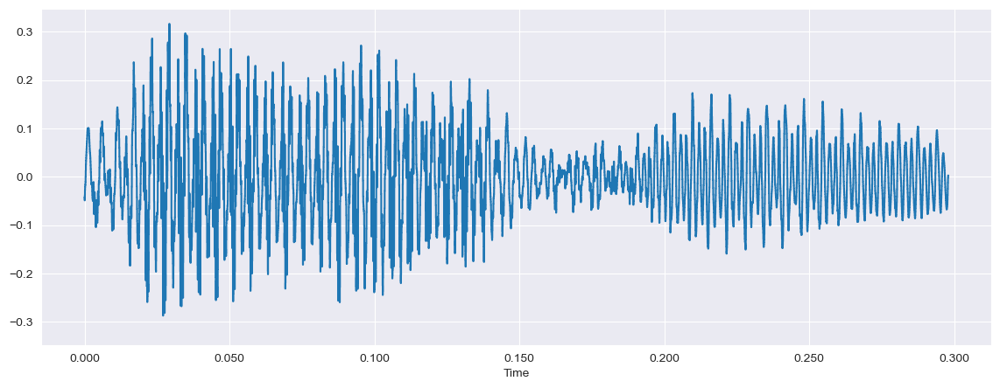

In [145]:
filename = 'free-spoken-digit-dataset-master/recordings/0_george_0.wav'
plt.figure(figsize=(14,5))
data,sample_rate = librosa.load(filename)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

Data Preprocessing

Function to convert audio file(wav form) to spectrogram


In [104]:
def wav_to_spectrogram(audio_path, save_path, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
  sample_rate, samples = wav.read(audio_path)
  fig = plt.figure()
  fig.set_size_inches((spectrogram_dimensions[0]/fig.get_dpi(), spectrogram_dimensions[1]/fig.get_dpi()))
  ax = plt.Axes(fig, [0., 0., 1., 1.])
  ax.set_axis_off()
  fig.add_axes(ax)
  ax.specgram(samples, cmap=cmap, Fs=2, noverlap=noverlap)
  ax.xaxis.set_major_locator(plt.NullLocator())
  ax.yaxis.set_major_locator(plt.NullLocator())
  fig.savefig(save_path, bbox_inches="tight", pad_inches=0)

In [105]:
def dir_to_spectrogram(audio_dir, spectrogram_dir, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
  file_names = [f for f in listdir(audio_dir) if isfile(join(audio_dir, f)) and '.wav' in f]
  for file_name in file_names:
    audio_path = audio_dir + file_name
    spectogram_path = spectrogram_dir + file_name.replace('.wav', '.png')
    wav_to_spectrogram(audio_path, spectogram_path, spectrogram_dimensions=spectrogram_dimensions, noverlap=noverlap, cmap=cmap)


<ipython-input-4-5c16c3a5386b>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


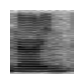

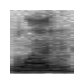

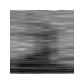

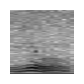

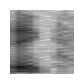

...

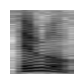

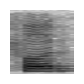

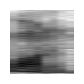

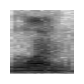

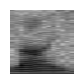

In [5]:
audio_folder = "/content/drive/MyDrive/free-spoken-digit-dataset-master/recordings/"
spectrogram_folder = "/content/drive/MyDrive/free-spoken-digit-dataset-master/spectrograms/"
dir_to_spectrogram(audio_folder, spectrogram_folder)

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
from tensorflow.keras.utils import load_img, img_to_array

In [18]:
imagesDir = "free-spoken-digit-dataset-master/spectrograms/"
count = 0
set_name = set() 
for file in os.listdir(imagesDir):
  name = file.split('_')[1]
  set_name.add(name)
  count+=1
print(count)
set_name

3000


{'george', 'jackson', 'lucas', 'nicolas', 'theo', 'yweweler'}

In [4]:
imagesDir = "free-spoken-digit-dataset-master/spectrograms/"
trainset = [] # Creating two sets (train and test) 
testset = []
for file in os.listdir(imagesDir):
  label = file.split('_')[0]
  name = file.split('_')[1]
  sample_number = file.split('_')[2]
  img = load_img(imagesDir+file)
  if name == "yweweler":
    testset.append([img_to_array(img), label])
  else:
    trainset.append([img_to_array(img), label])

In [5]:
# Get only images in the train list not the Labels
X_train = [item[0] for item in trainset]
# Get only Labels in the train list not the images
y_train = [item[1] for item in trainset]
# Get only images in the test list not the Labels
X_test = [item[0] for item in testset]
# Get only Labels in the test list not the images
y_test = [item[1] for item in testset]

In [6]:
# Convert list to numpy array in order to define input shape
X_train = np.asanyarray(X_train)
y_train = np.asanyarray(y_train)
X_test = np.asanyarray(X_test)
y_test = np.asanyarray(y_test)

In [7]:
# convert to one hot representation
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

#Normalize the images
X_train /= 255
X_test /= 255

Designing the Models

In [8]:
from keras.models import Sequential 
from keras import optimizers
from keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from keras import models
import tensorflow as tf
from sklearn.metrics import confusion_matrix,classification_report
import test

### Model - CNN Model | 6 CNN Layers with BatchNormalization and many Dropout Layers¶


In [19]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

class AdamW(Adam):
    def __init__(self, weight_decay_rate=0.01, *args, **kwargs):
        super(AdamW, self).__init__(*args, **kwargs)
        self.weight_decay_rate = weight_decay_rate

    def get_updates(self, loss, params):
        # Apply weight decay before updating the parameters
        if self.weight_decay_rate > 0.0:
            for p in params:
                if p.name in self.exclude_from_weight_decay:
                    continue
                loss += tf.keras.regularizers.l2(self.weight_decay_rate)(p)

        # Call the original Adam's update function
        updates = super(AdamW, self).get_updates(loss, params)
        self.updates = updates
        return self.updates

In [20]:
AdamW_optimizer = AdamW(learning_rate=0.001, weight_decay=0.01)

### Data Augmentation

In [ ]:
import librosa
import numpy as np

# Load the original audio waveform and obtain its spectrogram
audio, sample_rate = librosa.load('path_to_audio.wav')
spectrogram = librosa.feature.melspectrogram(y=audio, sr=sample_rate)

# Data augmentation
shift_amount = np.random.randint(low=-100, high=100)
shifted_spectrogram = np.roll(spectrogram, shift_amount, axis=1)

time_stretched_spectrogram = librosa.effects.time_stretch(spectrogram, rate=0.8)

pitch_shifted_spectrogram = librosa.effects.pitch_shift(spectrogram, sample_rate, n_steps=3)

background_noise, sr = librosa.load('path_to_background_noise.wav')
mixed_spectrogram = spectrogram + np.random.uniform(0, 0.1) * librosa.feature.melspectrogram(y=background_noise, sr=sr, n_mels=spectrogram.shape[0])

# You can further process and save the augmented spectrograms as needed


### Model Building

In [40]:
from tensorflow.keras import optimizers

In [56]:
data_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
def cnn_3():
    model = Sequential()
    
    model.add(Conv2D(32, (2, 2), padding='same', input_shape=data_shape, activation='relu'))
    model.add(Conv2D(32, (2, 2), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, (2, 2), padding='same', activation='relu'))
    model.add(Conv2D(64, (2, 2), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))
    model.add(Conv2D(128, (2, 2), padding='same', activation='relu'))
    model.add(Conv2D(128, (2, 2), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    
    #adam = optimizers.RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.AdamW(), metrics = ['accuracy'])
    
    return model

In [57]:
model3 = cnn_3()
model3.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 64, 64, 32)        416       
                                                                 
 conv2d_43 (Conv2D)          (None, 63, 63, 32)        4128      
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 31, 31, 32)       0         
 g2D)                                                            
                                                                 
 dropout_27 (Dropout)        (None, 31, 31, 32)        0         
                                                                 
 conv2d_44 (Conv2D)          (None, 31, 31, 64)        8256      
                                                                 
 conv2d_45 (Conv2D)          (None, 30, 30, 64)        16448     
                                                      

In [58]:
history = model3.fit(X_train, y_train, batch_size=32, epochs=100, 
                     verbose=0, validation_data=(X_test, y_test),
                     callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=12))

2023-05-20 20:06:14.842228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-20 20:06:23.630286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Epoch 23: early stopping


In [59]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

In [60]:
results = model3.evaluate(X_test, y_test)

16/16 [==============================] - 0s 21ms/step - loss: 0.3866 - accuracy: 0.8900


In [61]:
print('Test accuracy: ', results[1])

Test accuracy:  0.89000004529953


In [64]:
from sklearn.metrics import classification_report, confusion_matrix
Y_pred4 = model3.predict(X_test, len(y_test)//32)

 1/34 [..............................] - ETA: 8s

2023-05-20 20:12:30.083597: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


34/34 [==============================] - 1s 11ms/step


In [65]:
import numpy as np
y_pred4 = np.argmax(Y_pred4, axis=1)

In [66]:
print(y_test.shape, y_pred4.shape)

(500, 10) (500,)


In [67]:
rounded_labels = np.argmax(y_test, axis=1)

In [68]:
print(rounded_labels.shape, y_pred4.shape)

(500,) (500,)


In [81]:
### check the misclassification
y_pred4[rounded_labels == 5]

array([1, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 9, 5, 5, 5, 5, 5, 1, 5, 5, 5, 6, 5, 1, 5, 5,
       5, 5, 5, 5, 5, 5])

In [69]:
print('Confusion Matrix')
cm = confusion_matrix(rounded_labels, y_pred4)
print(cm)

Confusion Matrix
[[47  1  1  0  1  0  0  0  0  0]
 [ 0 50  0  0  0  0  0  0  0  0]
 [ 0  0 50  0  0  0  0  0  0  0]
 [ 0  0  0 48  0  0  1  0  1  0]
 [ 0  0  0  0 50  0  0  0  0  0]
 [ 0  7  0  0  0 41  1  0  0  1]
 [ 0  0  0  5  0  0 16  0 29  0]
 [ 0  0  0  0  0  0  0 50  0  0]
 [ 0  0  0  0  0  0  0  0 50  0]
 [ 0  6  0  0  0  0  0  1  0 43]]


In [ ]:
# Required to save models in HDF5 format
model3.save("spoken_digit_recognition_3.h5")

In [71]:
import pickle
pickle_out = open ("classifier.pk1","wb")
pickle.dump(model3,pickle_out)
pickle_out.close()

In [36]:
index = 11
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model3.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 7
1/1 [==============================] - 1s 645ms/step
Prediction 7


In [37]:
index = 12
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model3.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 9
1/1 [==============================] - 0s 34ms/step
Prediction 9


### Try with my own data

In [89]:
from pydub import AudioSegment
from pydub.silence import split_on_silence

def match_target_amplitude(aChunk, target_dBFS):
    ''' Normalize given audio chunk '''
    change_in_dBFS = target_dBFS - aChunk.dBFS
    return aChunk.apply_gain(change_in_dBFS)

In [99]:
# Load your audio.
song = AudioSegment.from_mp3("brian.wav")

In [100]:
# Split track where the silence is 2 seconds or more and get chunks using 
# the imported function.
chunks = split_on_silence (
    # Use the loaded audio.
    song, 
    # Specify that a silent chunk must be at least 2 seconds or 2000 ms long.
    min_silence_len = 500,
    # Consider a chunk silent if it's quieter than -16 dBFS.
    # (You may want to adjust this parameter.)
    silence_thresh = -35
)

# Process each chunk with your parameters
for i, chunk in enumerate(chunks):

    # Add the padding chunk to beginning and end of the entire chunk.
    audio_chunk =  chunk

    # Normalize the entire chunk.
    audio_chunk = match_target_amplitude(audio_chunk, -40.0)

    # Export the audio chunk with new bitrate.
    print("Exporting {0}.wav.".format(i))
    audio_chunk.export(
        "voice/raras{0}.wav".format(i),
        bitrate = "1411k",
        format = "wav"
    )

Exporting 0.wav.
Exporting 1.wav.
Exporting 2.wav.
Exporting 3.wav.
Exporting 4.wav.
Exporting 5.wav.
Exporting 6.wav.
Exporting 7.wav.
Exporting 8.wav.
Exporting 9.wav.


Name of participant

{'george', 'jackson', 'lucas', 'nicolas', 'theo', 'yweweler'}

In [154]:
filename = 'free-spoken-digit-dataset-master/recordings/1_lucas_30.wav'
#filename = "voice/brian0.wav"
plt.figure(figsize=(14,5))
data,sample_rate = librosa.load(filename)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

In [155]:
wave = data
non_silent_interval = librosa.effects.split(wave, top_db=0.1, hop_length=1000)
wave = wave[non_silent_interval[0][0]:non_silent_interval[0][1]]
librosa.display.waveshow(wave,sr=sample_rate)
ipd.Audio(filename)

In [156]:
#filename = 'free-spoken-digit-dataset-master/recordings/9_lucas_30.wav'
filename = "voice/brian1.wav"
plt.figure(figsize=(14,5))
data,sample_rate = librosa.load(filename)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

In [157]:
wave = data
non_silent_interval = librosa.effects.split(wave, top_db=0.1, hop_length=1000)
wave = wave[non_silent_interval[0][0]:non_silent_interval[0][1]]
librosa.display.waveshow(wave,sr=sample_rate)
ipd.Audio(filename)

In [106]:
audio_folder = "voice/"
spectrogram_folder = "spectrograms/"
dir_to_spectrogram(audio_folder, spectrogram_folder)

/var/folders/qw/g7lmpvlx2255lnn211m1tnp00000gn/T/ipykernel_34973/3323198064.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


In [107]:
import re
imagesDir = "spectrograms/"
holdout = [] # Creating two sets (train and test) 
for file in os.listdir(imagesDir):
  img = load_img(imagesDir+file)
  label = re.findall(r'\d+',file)[0]
  holdout.append([img_to_array(img), label])

In [108]:
# Get only images in the train list not the Labels
X_holdout = [item[0] for item in holdout]
# Get only Labels in the train list not the images
y_holdout = [item[1] for item in holdout]

In [109]:
X_holdout = np.asanyarray(X_holdout)
y_holdout = np.asanyarray(y_holdout)

# convert to one hot representation
y_holdout = to_categorical(y_holdout)

#Normalize the images
X_holdout /= 255

In [110]:
results = model3.evaluate(X_holdout, y_holdout)

1/1 [==============================] - 0s 234ms/step - loss: 8.4322 - accuracy: 0.0333


In [111]:
Y_pred_h = model3.predict(X_holdout, len(y_holdout)//32)

Y_pred_h = np.argmax(Y_pred_h, axis=1)

1/1 [==============================] - 0s 118ms/step


In [112]:
print(y_holdout.shape, Y_pred_h.shape)

(30, 10) (30,)


In [113]:
rounded_labels = np.argmax(y_holdout, axis=1)

In [115]:
print(rounded_labels.shape, Y_pred_h.shape)

(30,) (30,)


In [118]:
### check the misclassification
Y_pred_h[rounded_labels == 5]

array([2, 2, 2])

In [119]:
print('Confusion Matrix')
cm = confusion_matrix(rounded_labels, Y_pred_h)
print(cm)

Confusion Matrix
[[0 1 1 0 1 0 0 0 0 0]
 [0 1 2 0 0 0 0 0 0 0]
 [0 2 0 0 1 0 0 0 0 0]
 [0 0 1 0 2 0 0 0 0 0]
 [0 1 2 0 0 0 0 0 0 0]
 [0 0 3 0 0 0 0 0 0 0]
 [0 1 0 0 1 1 0 0 0 0]
 [0 2 1 0 0 0 0 0 0 0]
 [0 0 0 0 3 0 0 0 0 0]
 [0 2 1 0 0 0 0 0 0 0]]
